# Персиянов Михаил М05-202а.
## Задача 5

Для решения данной задачи необходимо найти точку схода (англ. vanishing point).
Её можно найти, используя дискретное преобразование Радона — известное в обработке
изображений как преобразование Хафа (ПХ, Hough transform) [1]. Известны алгоритмы
быстрого вычисления преобразования Хафа (БПХ), например, метод Брейди (Brady) [2, 3].

Сдается программа и набор данных. Необходимо описать, исходя из каких предпосы-
лок, было найдено проективное преобразование.

Набор данных: не менее 10 фотографий многоэтажного здания с окнами, сделанная
снизу вверх и с заваленным горизонтом.

## Список литературы
[1] Hough Paul VC. Method and means for recognizing complex patterns. — 1962. — US Patent
3,069,654.

[2] Brady M. L. A fast discrete approximation algorithm for the Radon transform // SIAM
Journal on Computing. — 1998. — Vol. 27, no. 1. — P. 107–119.

[3] Ершов Е.И., Асватов Е.Н., Николаев Д.П. Робастная ортогональная линейная регрес-
сия для маломерных гистограмм // Сенсорные системы. — 2017. — Т. 31, No 4. — С. 331–342.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import io
from skimage.transform import ProjectiveTransform, rescale, warp

from clustering import cluster_lines_skimage
from homography import get_vanishing_point
from image import preprocess_image
from line import draw_lines, get_kb, get_lines_skimage

Рассмотрим решение для определенной картинки, а затем выполним алгоритм для всех картинок из датасета. Для этого загрузим картинку с помощью метода **preprocess_image**, в которой преобразование картинки выглядит следующим образом:

1. Перевод *rgb* картинки в оттенки серого.
2. Применение гауссовского фильтра для подавления шума.
3. Поиск краев, с помощью алгоритма Canny.

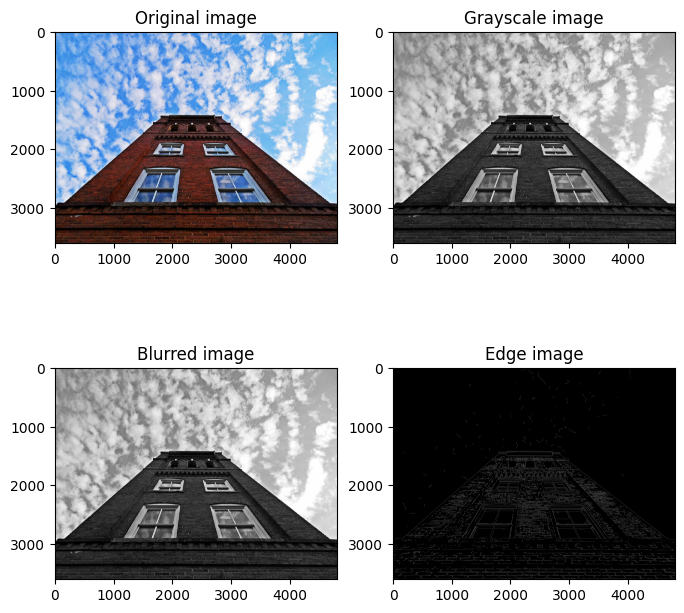

In [ ]:
image, orig_image = preprocess_image("InputImages/1633601732_6-p-foto-doma-snizu-vverkh-foto-6.jpg", plot=True)

Затем, на преобразованной картинке найдем прямые с помощью преобразования Хаффа и из всех прямых выделим 20 наиболее достоверных линий с помощью функции **skimage.transform.hough_line_peaks**.

In [3]:
thetas, rhos = get_lines_skimage(image)

Кластеризуем точки с помощью метода kNN по углу наклона. И изобразим кластеры на графике.

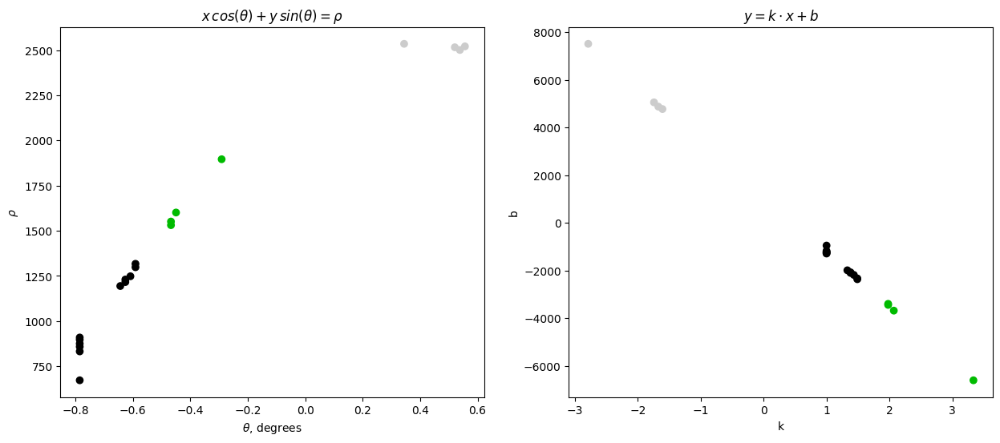

In [4]:
clusters = cluster_lines_skimage(thetas, rhos, 3, plot=True)

Найдем два кластера, где точки расположены "близко", то есть имеют минимальный первый момент.

In [5]:
errors = []
for c, lines in clusters.items():
    points = [(theta, rho) for [(theta, rho)] in lines]
    x, y = zip(*points)
    center_x, center_y = np.mean(x), np.mean(y)
    errors.append(np.sum((x-center_x) ** 2 + (y-center_y) ** 2))
target_clusters = np.argpartition(errors, 2)[:2]
target_clusters

array([1, 2])

Изобразим полученное разбиение на кластеры на исходном изображении в оттенках серого.

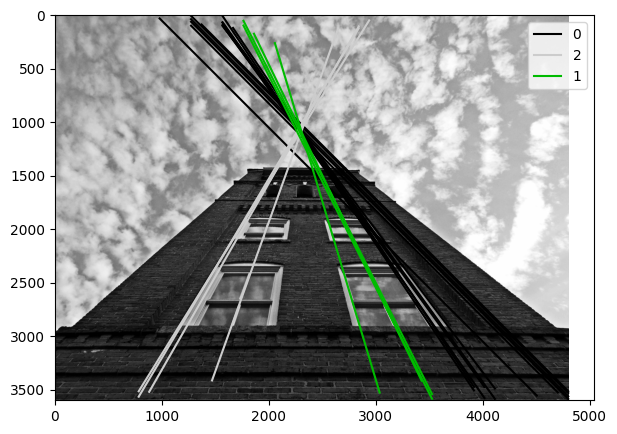

In [6]:
draw_lines(orig_image, clusters)

Преобразование будем делать по прямым из кластеров 1 и 2. Такое разбиение выглядит достаточно робастным.

In [7]:
lines_selected = []
for c in target_clusters:
    lines_selected.extend(clusters[c])
lines_selected

[[(-0.2912150493496157, 1896.0)],
 [(-0.46770901865241304, 1551.0)],
 [(-0.46770901865241304, 1531.0)],
 [(-0.45005962172213326, 1601.0)],
 [(0.5206572094432522, 2516.0)],
 [(0.538306606373532, 2501.0)],
 [(0.34416324014045485, 2535.0)],
 [(0.5559560033038118, 2521.0)]]

Найдем точку схода с помощью следующего [алгоритма](https://drive.google.com/file/d/1iundsMKpeOYUU6c5ATgK9ovWdRbiZkaW/view), похожего на алгоритм [RANSAC](https://en.wikipedia.org/wiki/Random_sample_consensus#:~:text=Random%20sample%20consensus%20(RANSAC)%20is,the%20values%20of%20the%20estimates.).

1. Берем пересечение двух прямых.
2. Считаем ошибку, как корень из квадрата расстояний до каждой из прямых.

In [8]:
vp = get_vanishing_point(lines_selected)
vp

[2289.3162869911002, 1092.2920946210547]

Если посмотреть на картинку, то точка схода находится **достаточно разумно**.

In [9]:
y_max, x_max = image.shape
high_horizon = 0.4
x_shift = 0.5
high_mul = 4
res_downscale = 0.25

In [30]:
src, dst = [], []
for line in lines_selected:
    [(theta, rho)] = line
    # y = kx + b
    k, b = get_kb(theta, rho)
    x_0 = (y_vp - b + 1/k * x_vp) / (k + 1/k)
    y_0 = k * x_0 + b
    dist_to_line = np.sqrt((y_vp - y_0) ** 2 + (x_vp - x_0) ** 2)
    print(dist_to_line)
    x_1, y_1 = (y_max - b) / k, y_max
    dist = np.sqrt((x_1 - x_0) ** 2 + (y_1 - y_0) ** 2)
    src.append([x_0, y_0])
    src.append([x_1, y_1])
    if x_0 < x_vp:
        dst.append([x_vp - dist_to_line, y_vp])
        dst.append([x_vp - dist_to_line, y_1])
    else:
        dst.append([x_vp + dist_to_line, y_vp])
        dst.append([x_vp + dist_to_line, y_1])
#     x1, y1 = (y_max - b) / k, y_max
#     x2, y2 = (y_vp - b) / k, y_vp
#     x3, y3 = (x1 + x2) / 2, (y1 + y2) / 2
#     dist = np.sqrt((x1-x2)**2 + (y1-y2)**2)
#     print(f"({x2}, {y2}) -> ({x1}, {y_max - dist})")
#     delta = x2 - x1
#     src.append([x3, y3])
#     dst.append([x1 + x_max * x_shift, y3 * 5])
#     src.append([x1, y1])
#     dst.append([x1 + x_max * x_shift, y1 * 5])
# for (k, b) in lines_vanya:
#     x_0 = (y_max*high_horizon - b) / k
#     x_1 = (y_max - b) / k
#     src.append([x_1, y_max])
#     dst.append([x_1+int(x_max*x_shift), y_max*high_mul])
#     src.append([x_0, y_max*high_horizon])
#     dst.append([x_1+int(x_max*x_shift), y_max*high_horizon*high_mul])

0.0
6.172701329058942
5.084229945850415e-13
13.887879764878122


In [27]:
src = np.array(src)*res_downscale
dst = np.array(dst)*res_downscale

In [31]:
transform = ProjectiveTransform()
transform.estimate(dst, src)
transform.params

array([[-4.06189904e+00,  3.79681632e-02,  7.30650970e+03],
       [-6.55662550e-01, -6.66809588e-03,  1.20886456e+03],
       [-5.89496520e-04,  2.14088734e-05,  1.00000000e+00]])

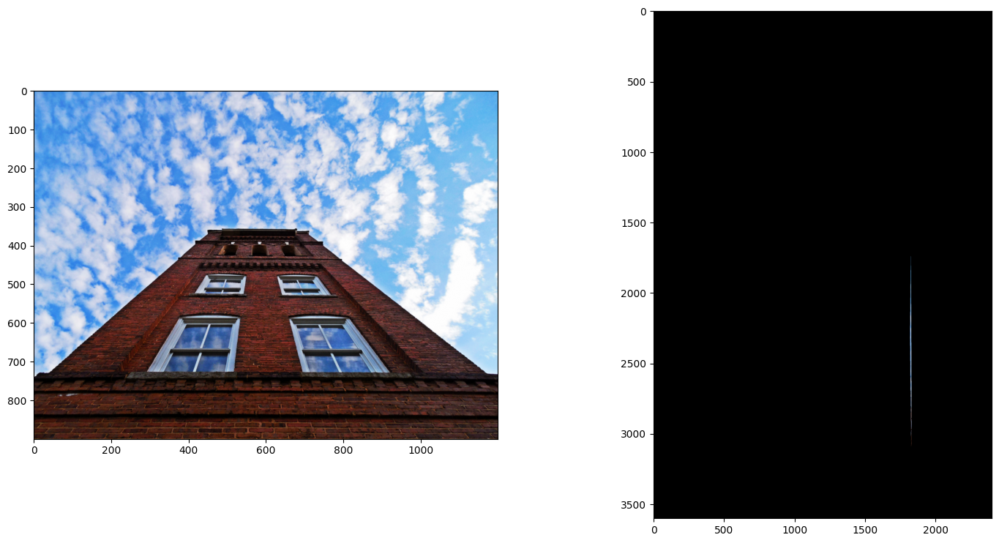

In [34]:
image_rgb = io.imread("InputImages/1633601732_6-p-foto-doma-snizu-vverkh-foto-6.jpg", plugin='matplotlib')
image_scaled = rescale(image_rgb, res_downscale, channel_axis=2)
fig, ax = plt.subplots(1, 2, figsize=(18, 9))
ax[0].imshow(image_scaled)
ax[1].imshow(warp(image_scaled, transform, clip=False, output_shape=(int(y_max*high_mul*res_downscale), int((x_max+int(x_max*x_shift)*2)*res_downscale))))
plt.show()

In [14]:
image_dir = "InputImages"
import os

In [16]:
files = [os.path.join(image_dir, item) for item in os.listdir(image_dir)]
files

['InputImages/1633601732_6-p-foto-doma-snizu-vverkh-foto-6.jpg',
 'InputImages/1633601797_20-p-foto-doma-snizu-vverkh-foto-33.jpg',
 'InputImages/1633601733_15-p-foto-doma-snizu-vverkh-foto-20.jpg',
 'InputImages/1633601728_17-p-foto-doma-snizu-vverkh-foto-25.jpg',
 'InputImages/1633601806_42-p-foto-doma-snizu-vverkh-foto-68.jpg',
 'InputImages/1633601775_37-p-foto-doma-snizu-vverkh-foto-59.jpg',
 'InputImages/1633601772_12-p-foto-doma-snizu-vverkh-foto-15.jpg',
 'InputImages/1633601806_44-p-foto-doma-snizu-vverkh-foto-70.jpg',
 'InputImages/horizon-cloud-sky-sunlight-sqpc.jpeg',
 'InputImages/1633601784_50-p-foto-doma-snizu-vverkh-foto-78.jpg',
 'InputImages/1633601774_48-p-foto-doma-snizu-vverkh-foto-75.jpg']

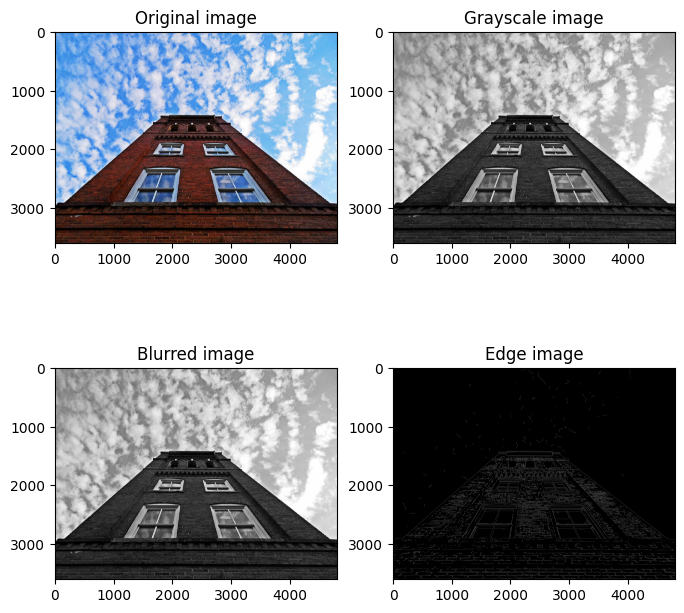

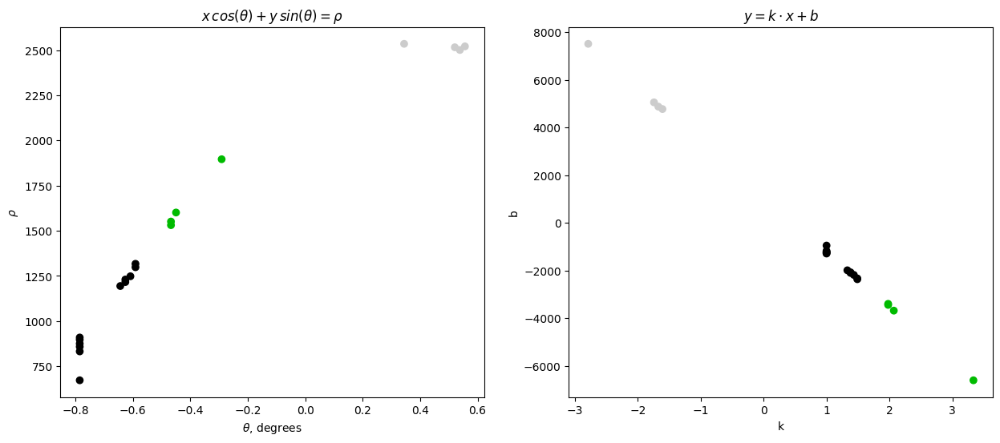

Target clusters: [1 2]


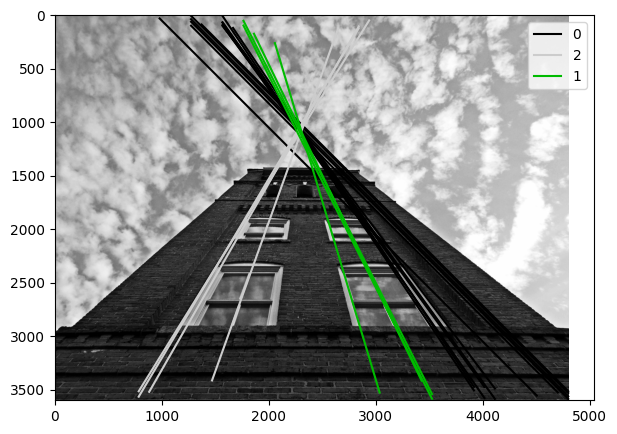

Vanishing point: (2289.3162869911002, 1092.2920946210547)
16.68861654888506
0.0
20.000000000000036
14.819210932943154
13.325673100305142
24.556183245360135
11.384243307377895
4.547473508864641e-13


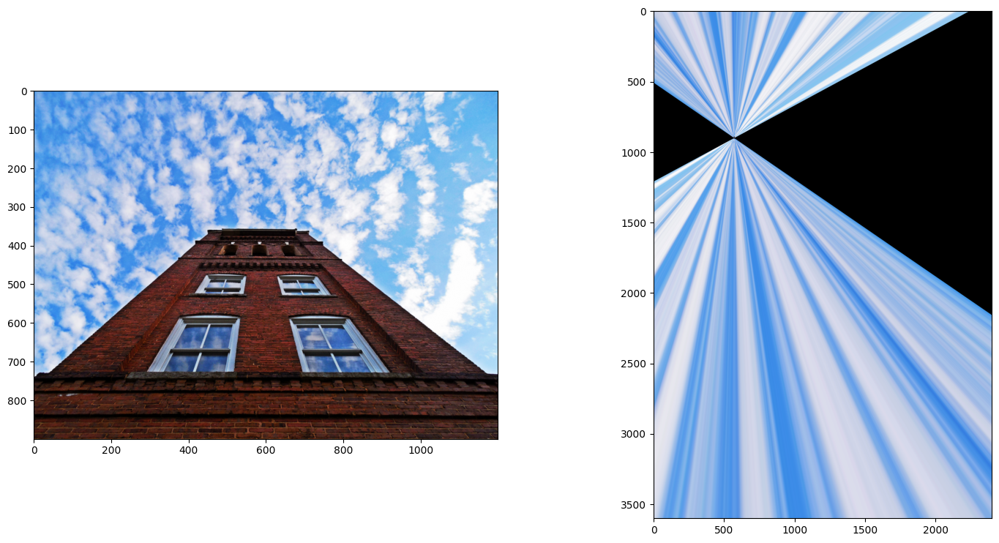

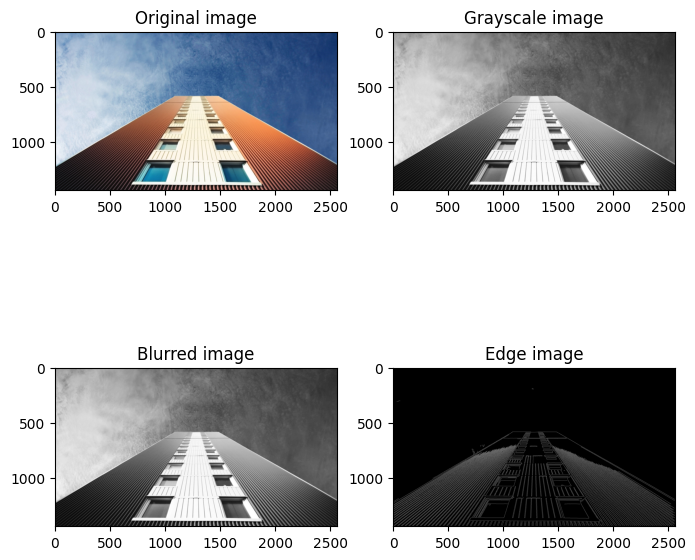

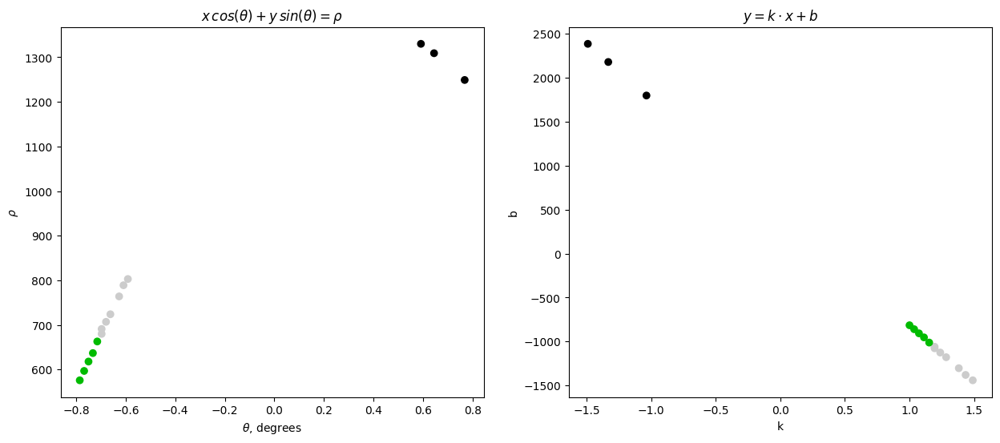

Target clusters: [0 2]


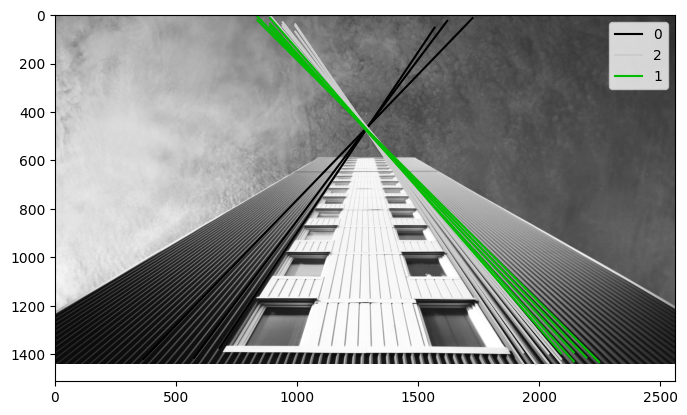

Vanishing point: (1286.2457431418843, 467.1385026459441)
0.8587253897013157
1.720366054940961
0.0
4.017718114098767
6.211790499161955
0.0
1.1131313074788083
3.567983860753727
4.7882095008380325
4.51059792727829


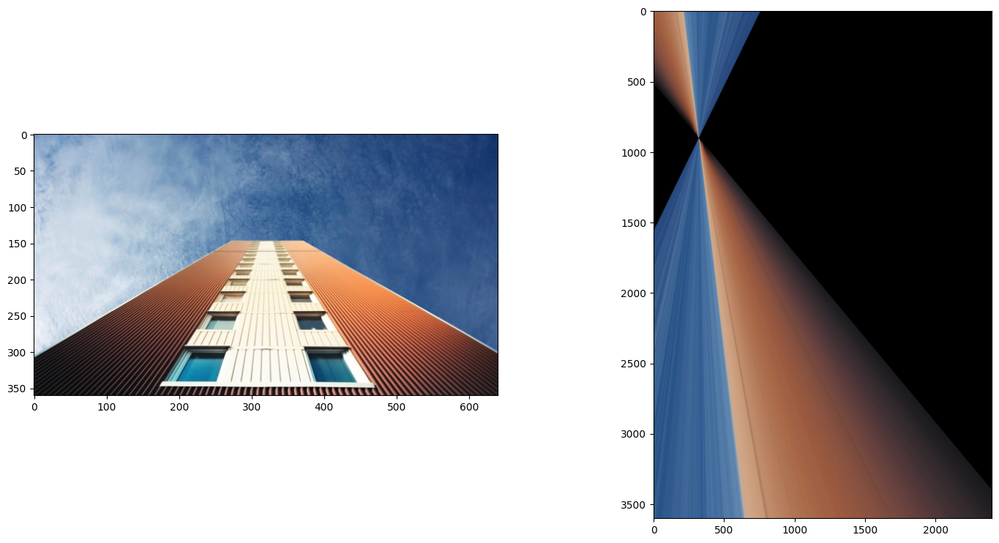

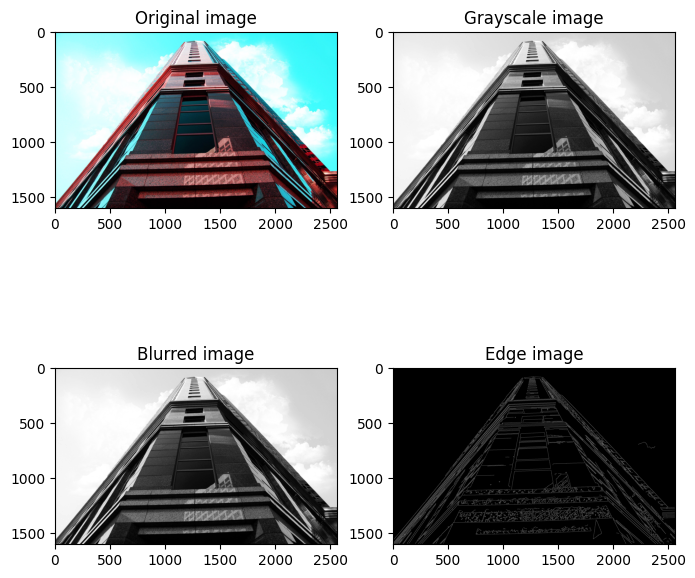

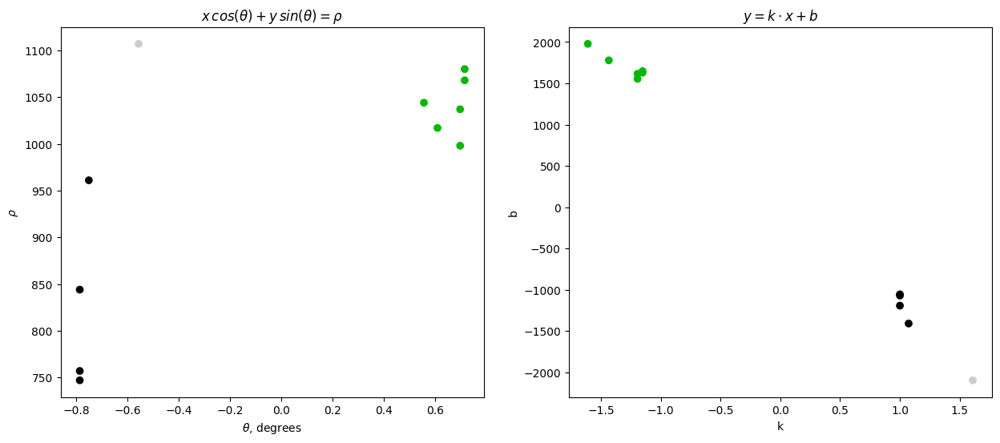

Target clusters: [2 0]


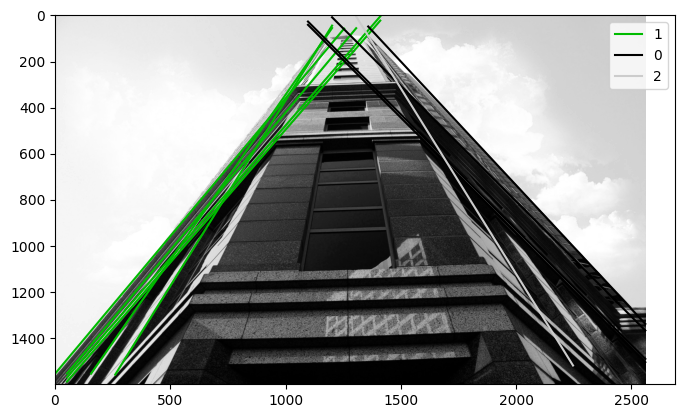

Vanishing point: (1483.2479171260286, 289.6516704831365)
0.0
87.00000000000006
96.99999999999999
0.0
73.2833455259256


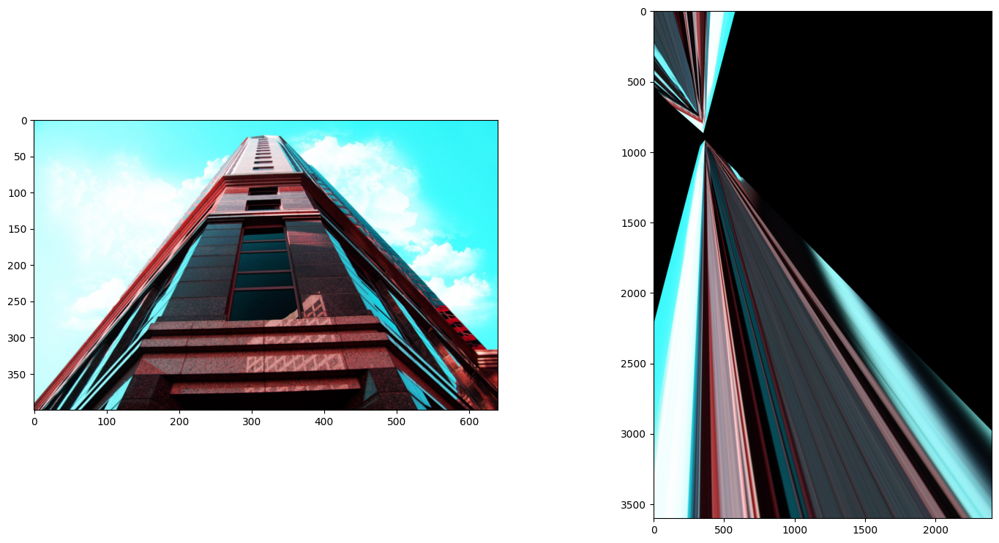

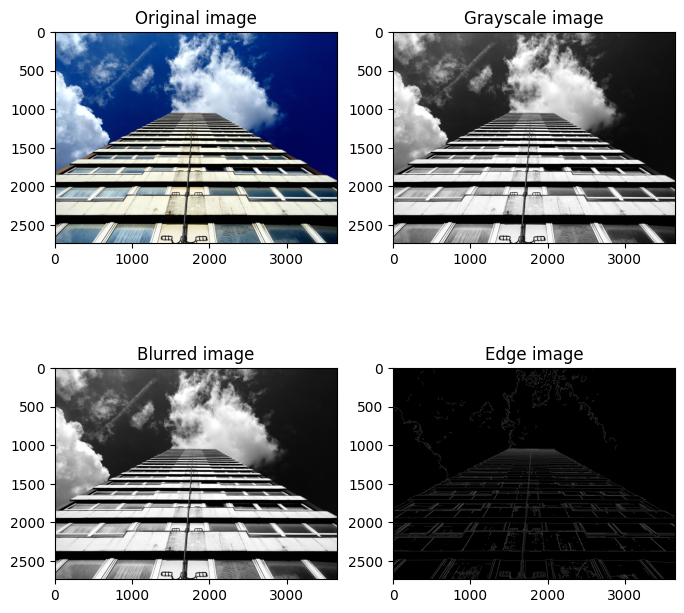

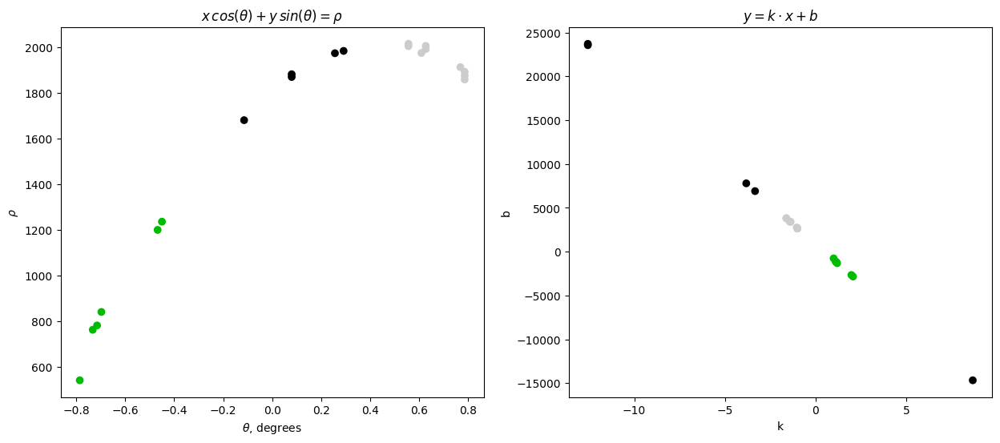

Target clusters: [2 0]


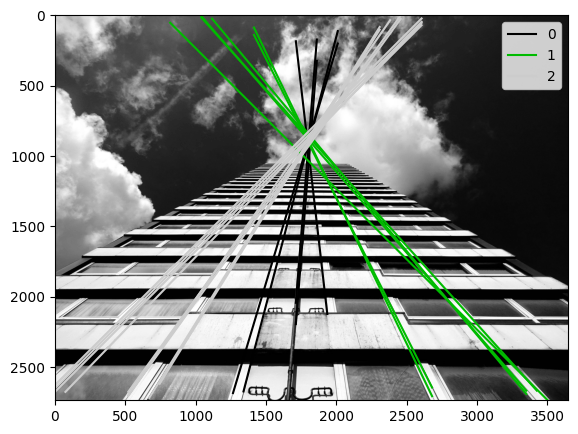

Vanishing point: (1810.9756083443983, 864.7164516654973)
16.999999999999975
16.981435929569884
9.405111424314816
0.0
19.40511142431472
30.98143592956984
8.48596350560368
6.089472344826814
33.99999999999995
4.872462220242392
2.2737367544323206e-13
7.1275377797576915
20.087862610694796
2.1173210620742937


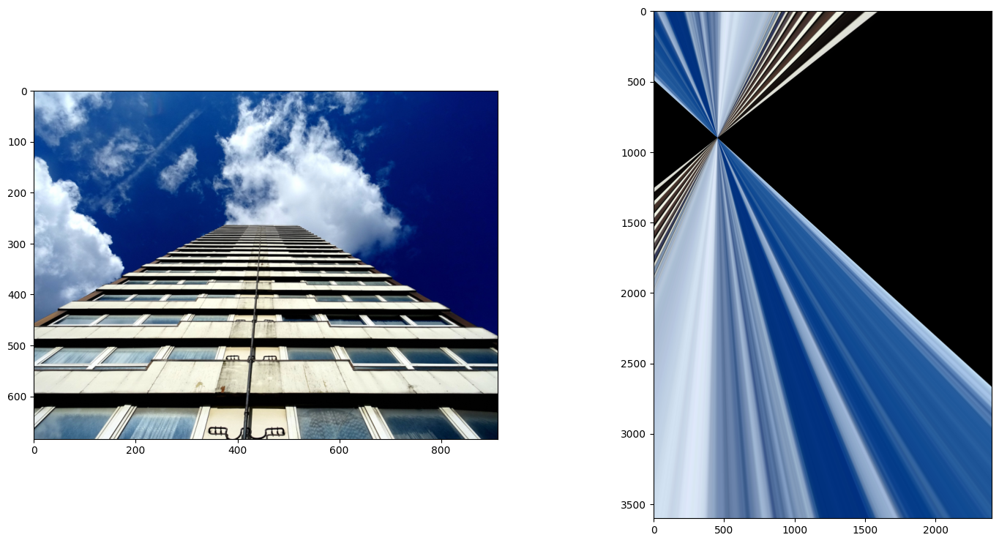

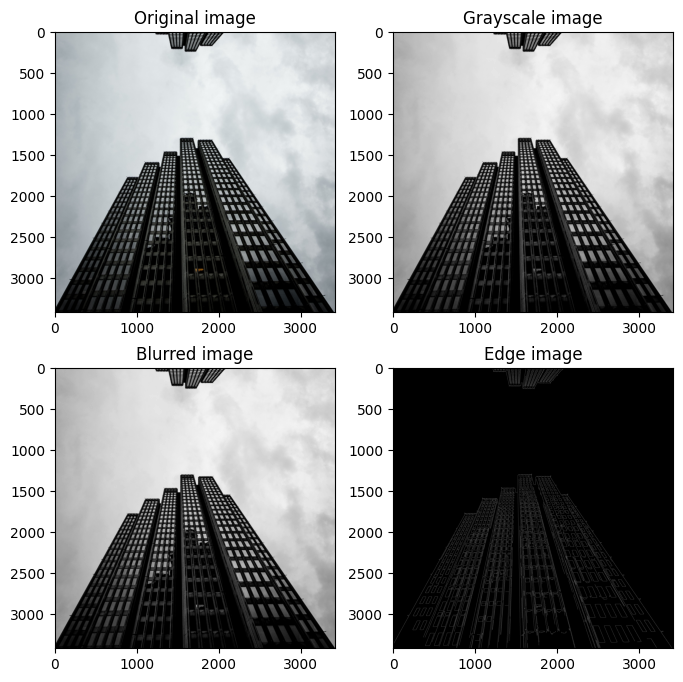

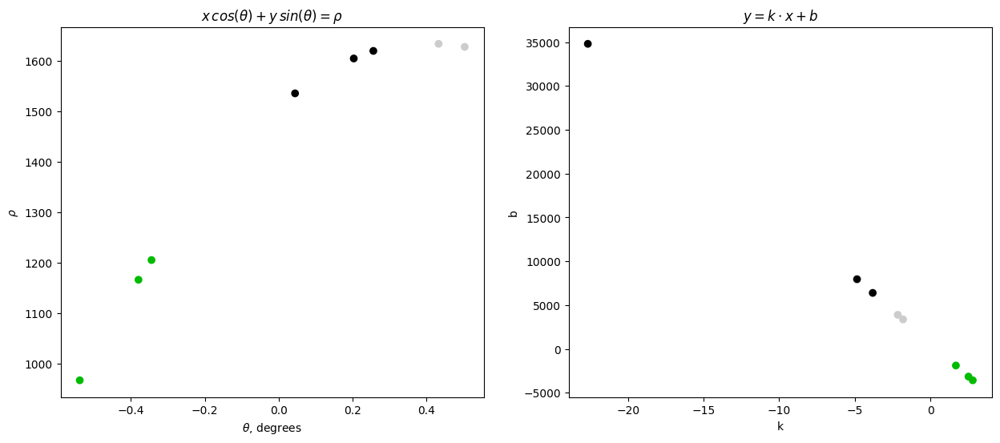

Target clusters: [1 2]


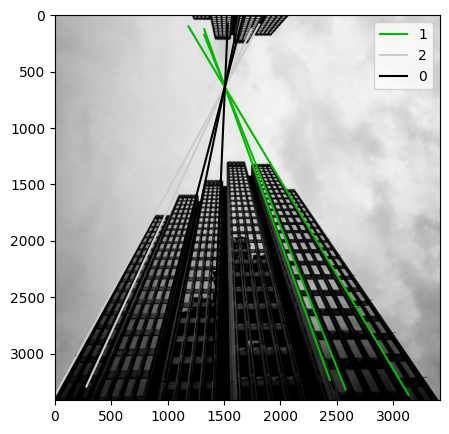

Vanishing point: (1507.652651637328, 634.9593163034629)
2.2737367544323206e-13
1.9047968541101987
0.7978156470260704
5.084229945850415e-13
1.972132083316609


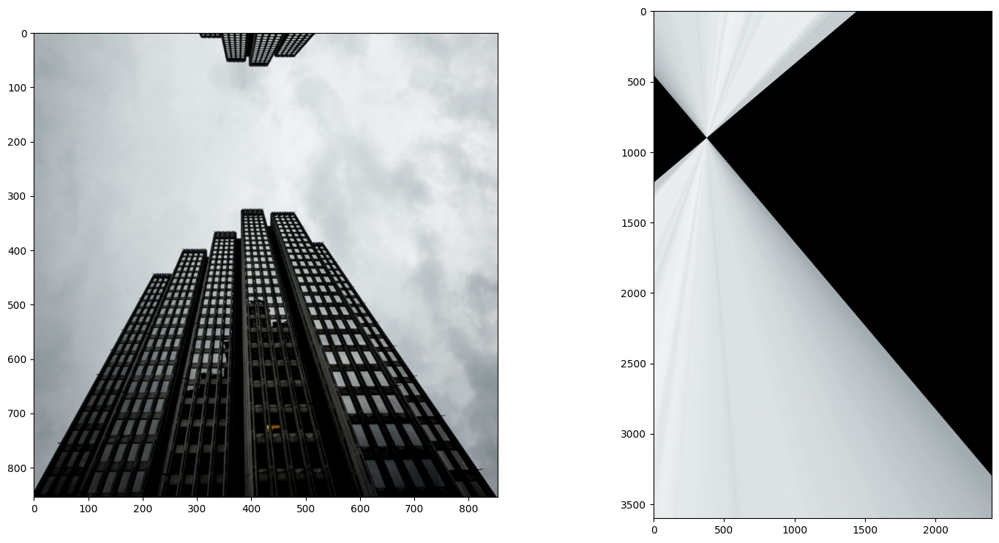

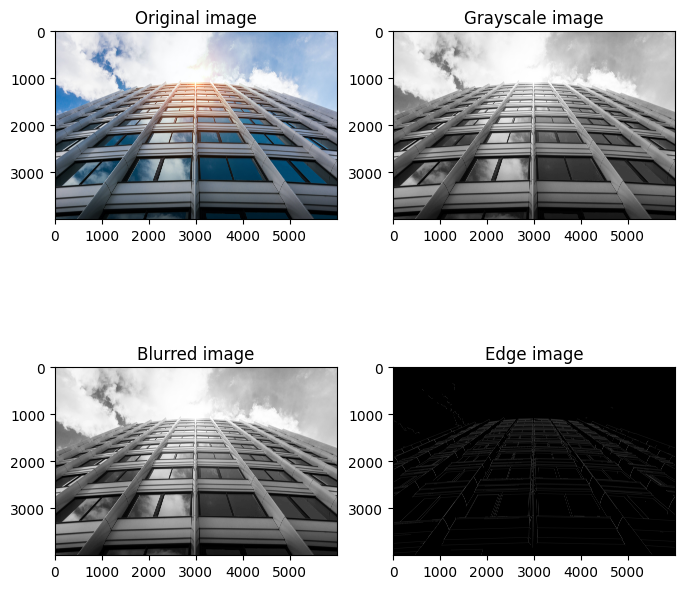

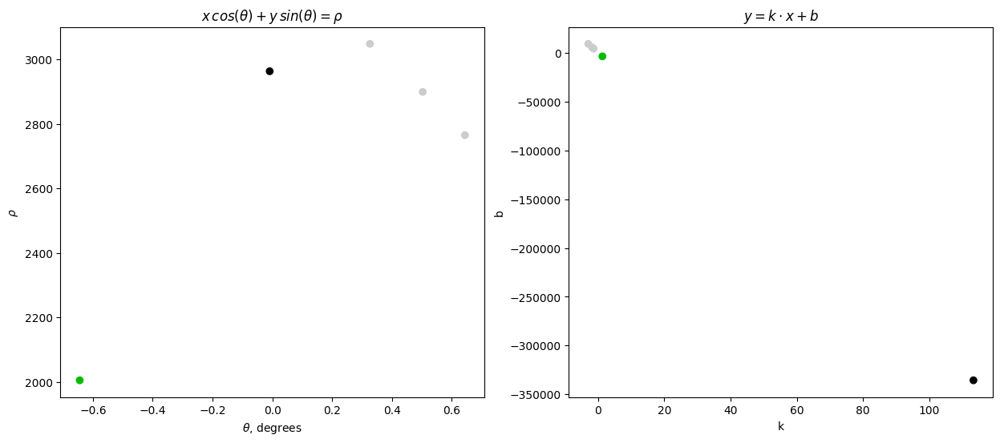

Target clusters: [0 2]


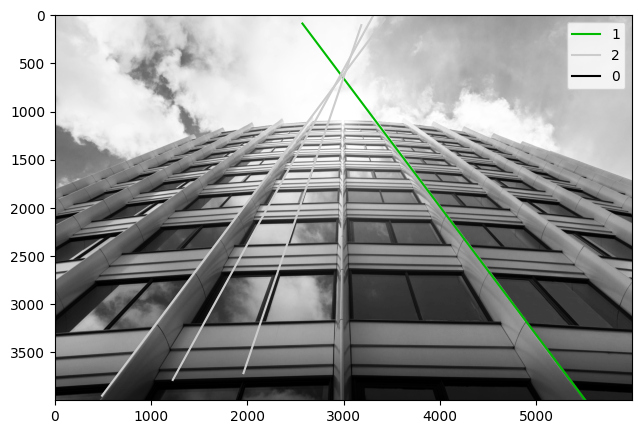

Vanishing point: (2968.863266311568, 651.3243622031878)
0.0
2.3651234412583733e-11
27.08515259903317
16.10904185454929


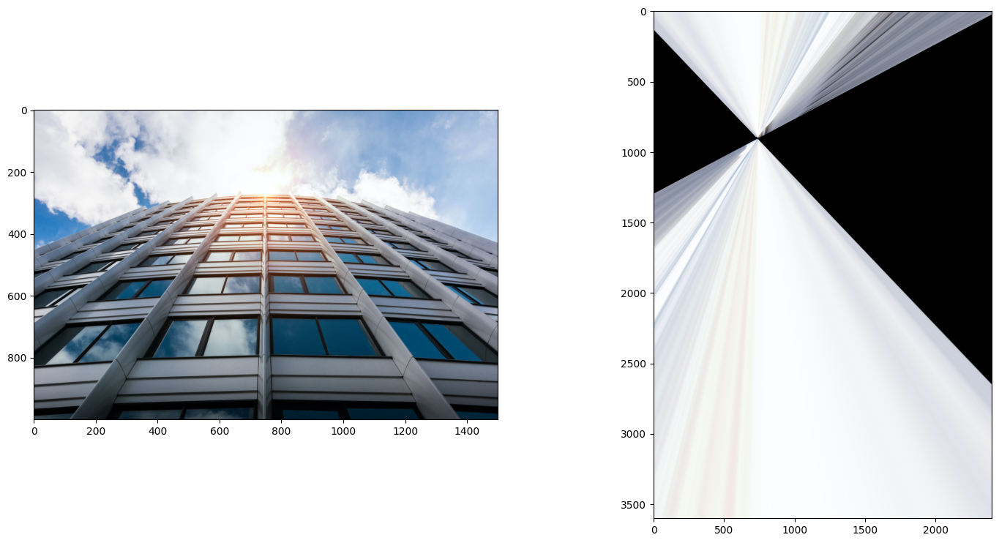

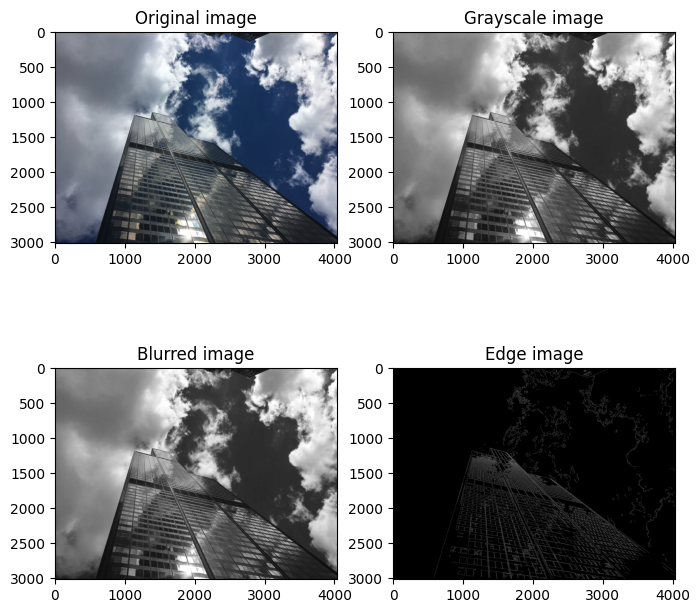

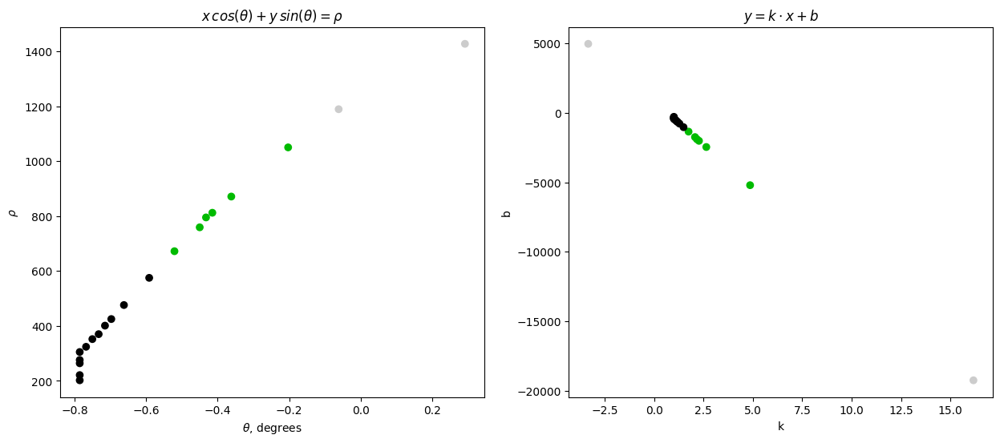

Target clusters: [2 1]


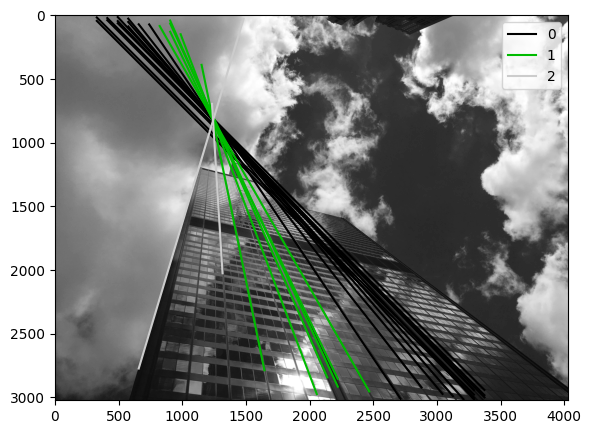

Vanishing point: (1244.2567343918176, 818.942618174463)
0.0
2.3272314066767517
8.4531205236997
3.2505676574066285
3.2155493553843715e-13
3.6350919004910884
2.8183023244753
5.099322663771566


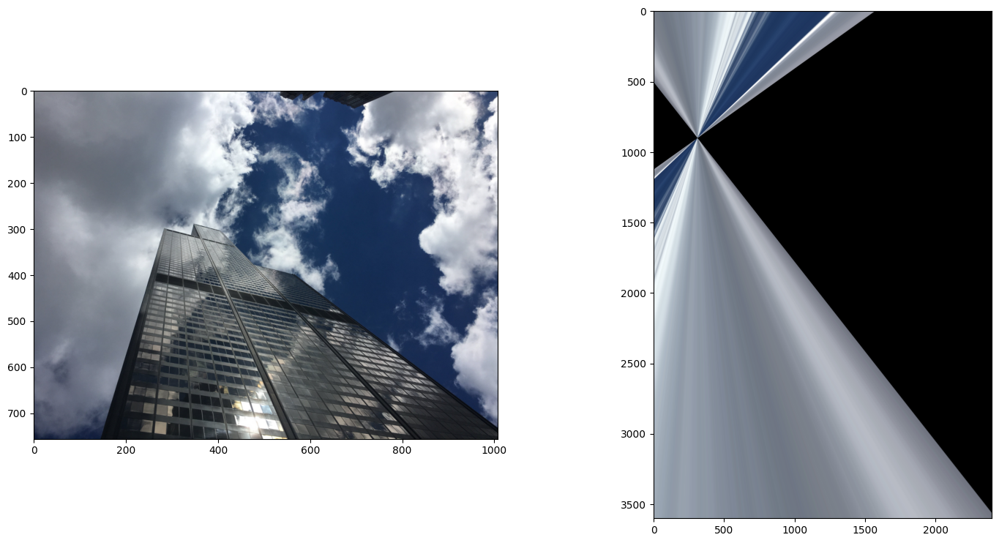

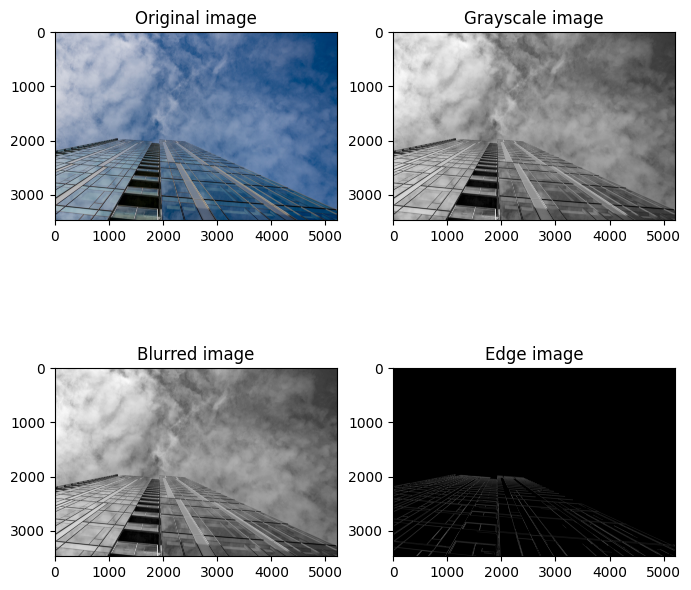

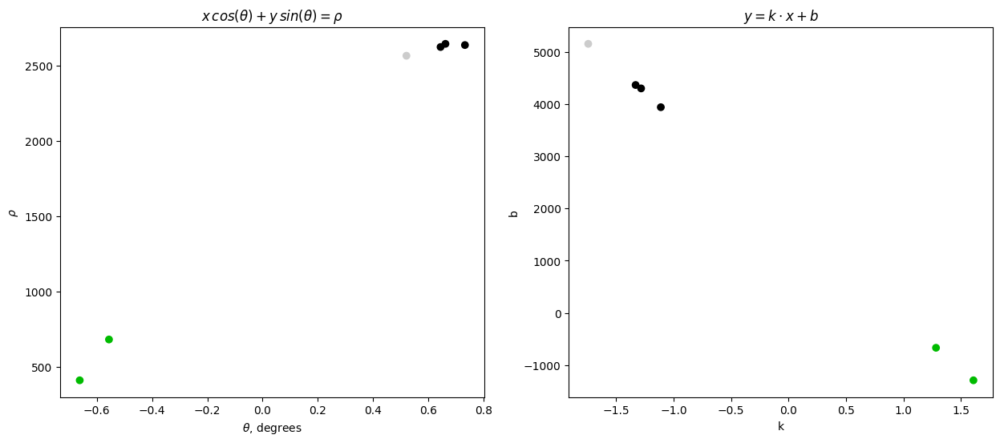

Target clusters: [1 0]


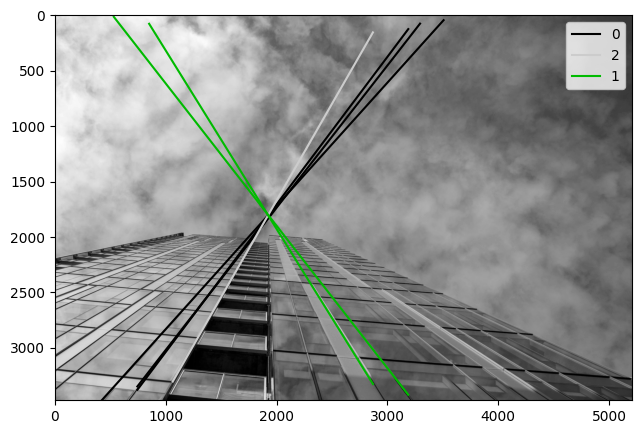

Vanishing point: (1925.1366077780694, 1806.1465512328487)
6.431098710768743e-13
2.366121963086423
4.547473508864641e-13
2.1709840894970163
16.32602921539143


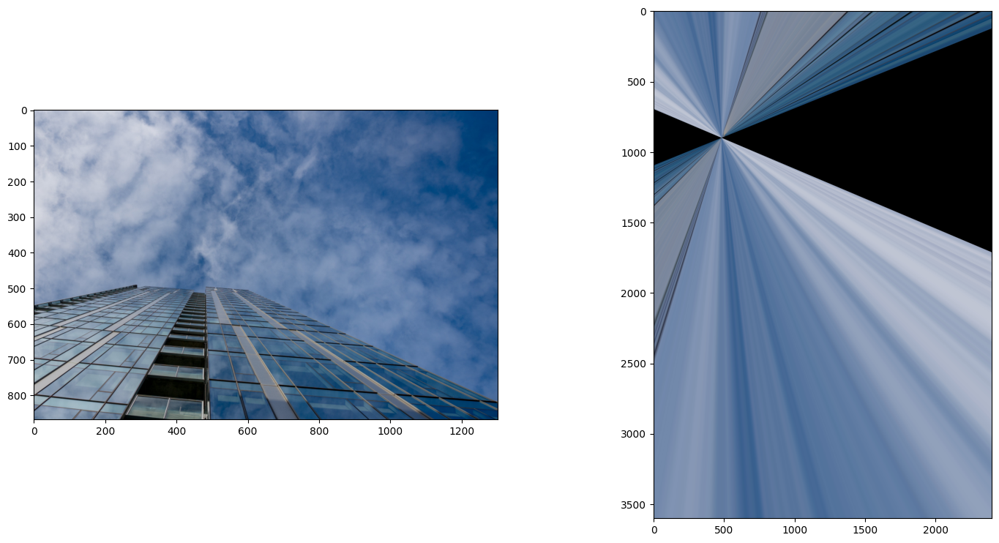

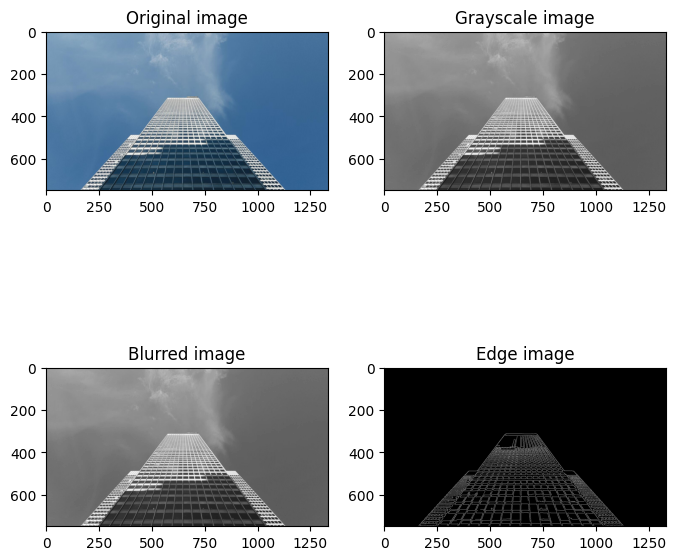

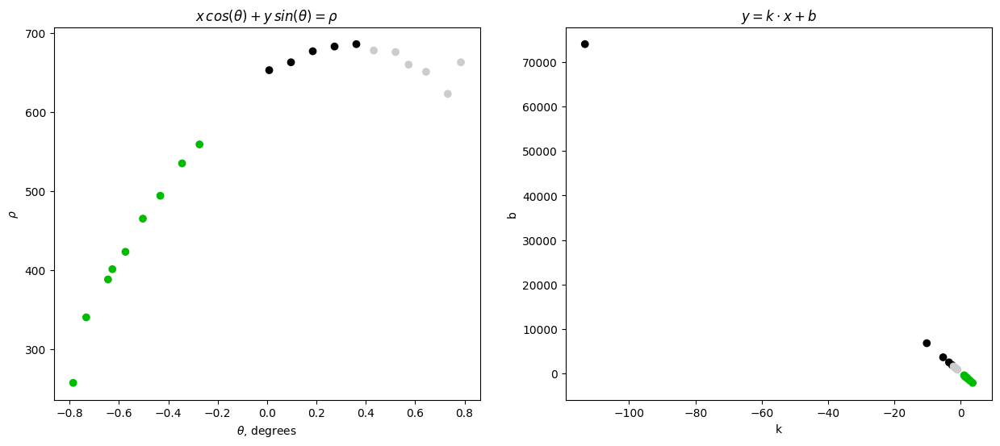

Target clusters: [1 2]


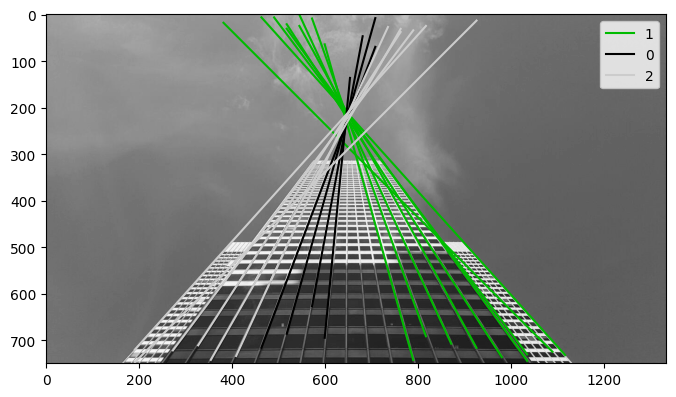

Vanishing point: (645.8639135614413, 232.6220787750426)
6.742269051781569
11.273494782144017
15.328230872541267
11.28481839860353
5.065163138365324
14.215370520601928
35.20610364743352
5.499572734644331
0.0
5.122843494938195
8.728951483983089
2.2737367544323206e-13
5.900240205637825
41.81659764147875
12.777414866441957


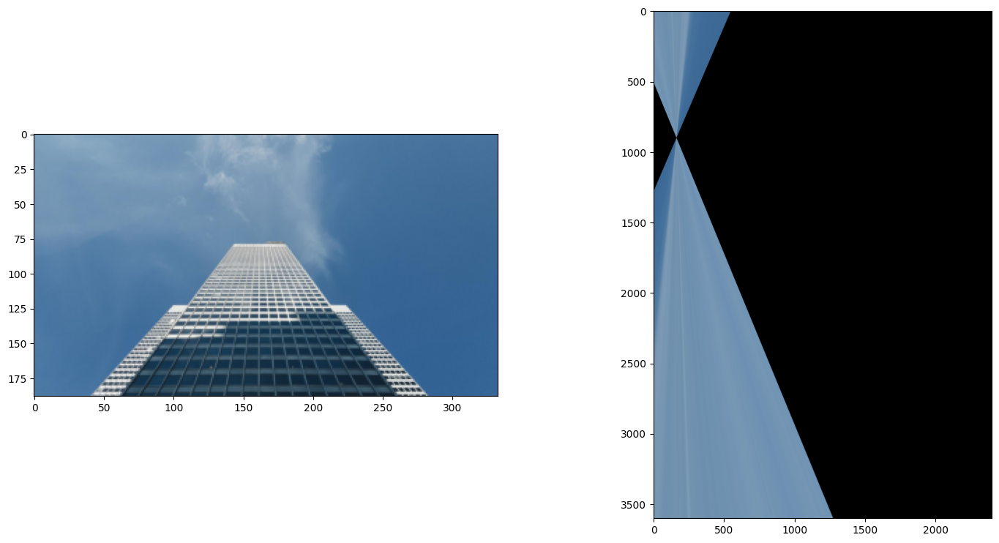

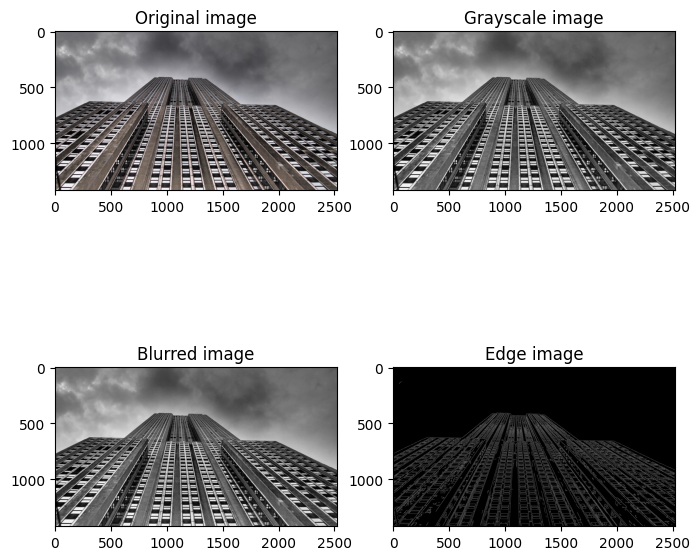

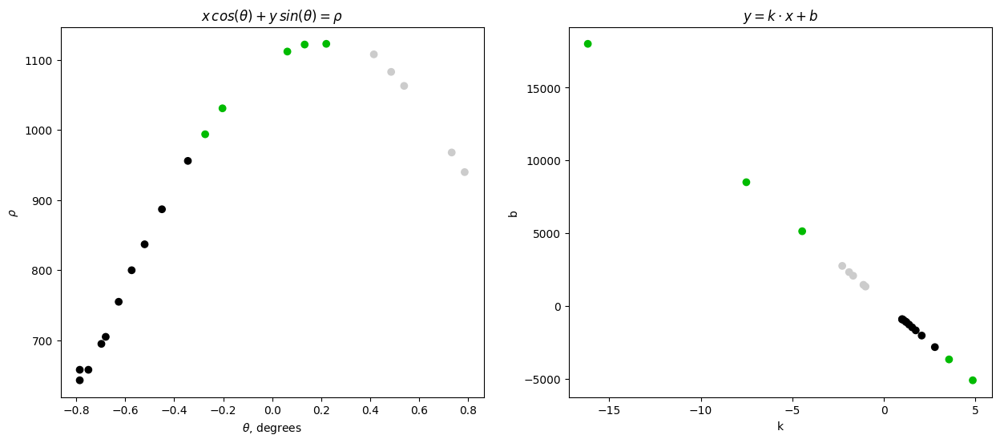

Target clusters: [2 1]


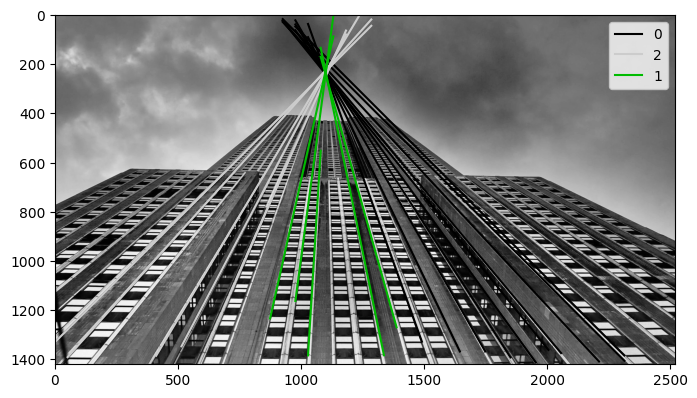

Vanishing point: (1100.1498379000766, 231.0111714801883)
2.136309996049933
8.038053724335075
4.479220960181953
1.2729765839148255
0.0
2.8279244561447263
0.9846417876398871
5.084229945850415e-13
0.3126336290754634
1.0376463746372124


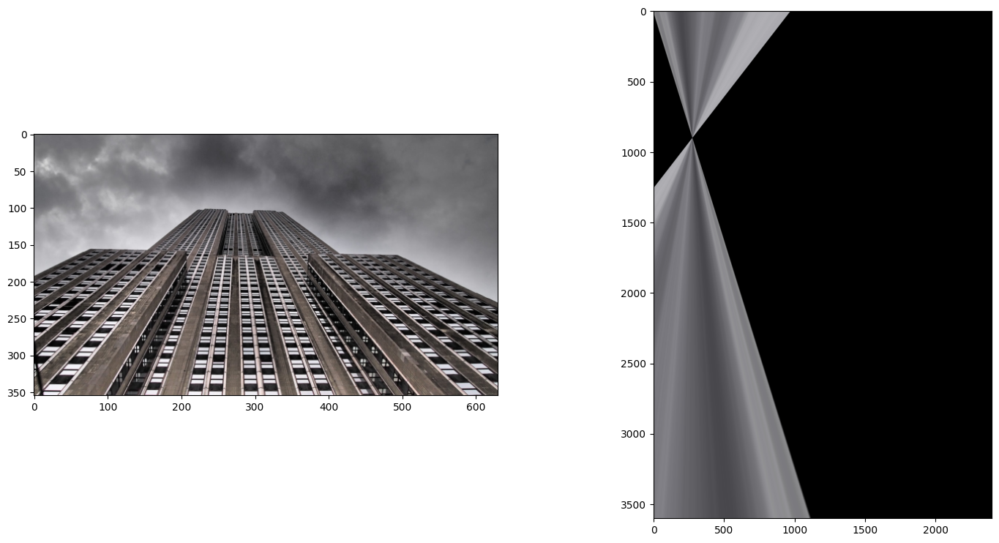

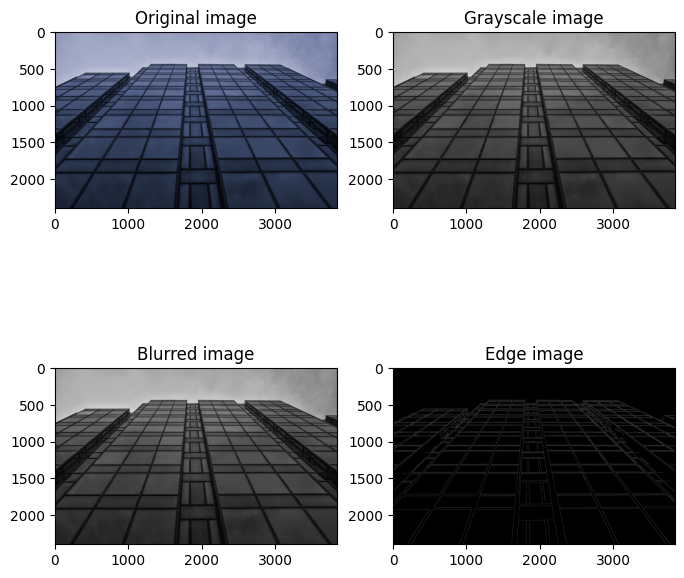

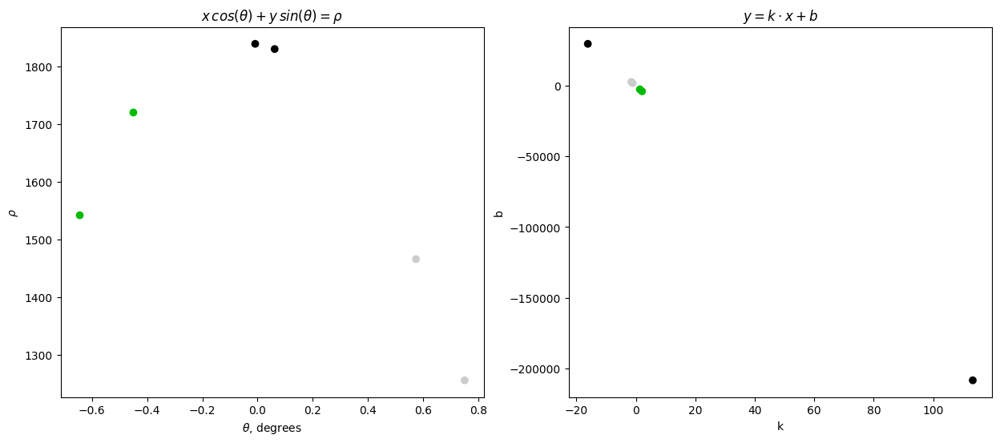

Target clusters: [2 1]


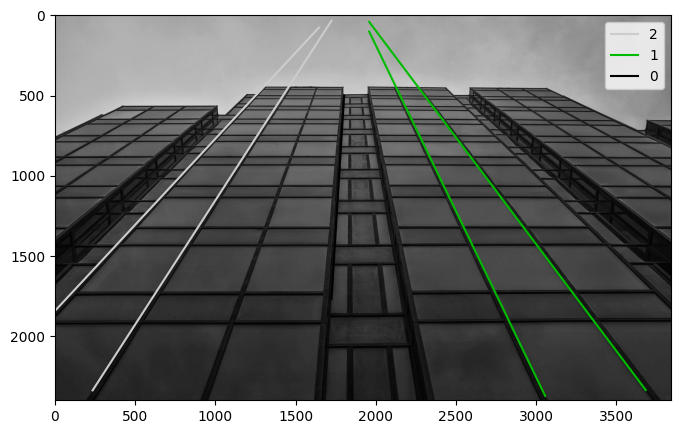

Vanishing point: (1833.99464588788, -125.84391170946833)
0.0
6.172701329058942
5.084229945850415e-13
13.887879764878122


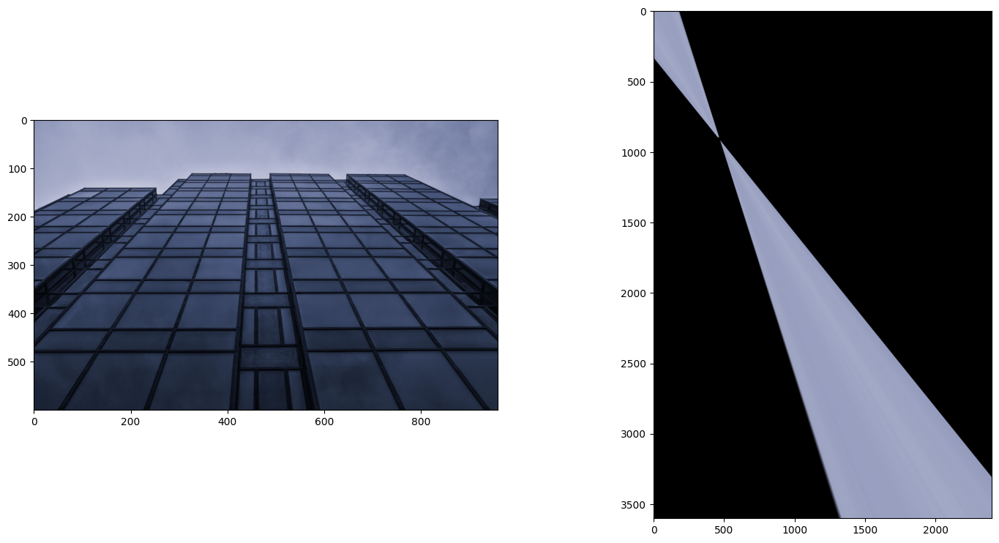

In [19]:
for file in files:
    image, orig_image = preprocess_image(file, plot=True)
    thetas, rhos = get_lines_skimage(image)
    clusters = cluster_lines_skimage(thetas, rhos, 3, plot=True)
    
    errors = []
    for c, lines in clusters.items():
        points = [(theta, rho) for [(theta, rho)] in lines]
        x, y = zip(*points)
        center_x, center_y = np.mean(x), np.mean(y)
        errors.append(np.sum((x-center_x) ** 2 + (y-center_y) ** 2))
    target_clusters = np.argpartition(errors, 2)[:2]
    print(f"Target clusters: {target_clusters}")
    draw_lines(orig_image, clusters)
    
    lines_selected = []
    for c in target_clusters:
        lines_selected.extend(clusters[c])
        
    vp = get_vanishing_point(lines_selected)
    x_vp, y_vp = vp
    print(f"Vanishing point: ({x_vp}, {y_vp})")
    
    
#     src, dst = [], []
#     for line in lines_selected:
#         [(theta, rho)] = line
#         # y = kx + b
#         k, b = get_kb(theta, rho)
#         x_0 = (y_max*high_horizon - b) / k
#         x_1 = (y_max - b) / k
#         src.append([x_1, y_max])
#         dst.append([x_1+int(x_max*x_shift), y_max*high_mul])
#         src.append([x_0, y_max*high_horizon])
#         dst.append([x_1+int(x_max*x_shift), y_max*high_horizon*high_mul])
    src, dst = [], []
    for line in lines_selected:
        [(theta, rho)] = line
        # y = kx + b
        k, b = get_kb(theta, rho)
        x_0 = (y_vp - b + 1/k * x_vp) / (k + 1/k)
        y_0 = k * x_0 + b
        dist_to_line = np.sqrt((y_vp - y_0) ** 2 + (x_vp - x_0) ** 2)
        print(dist_to_line)
        x_1, y_1 = (y_max - b) / k, y_max
        dist = np.sqrt((x_1 - x_0) ** 2 + (y_1 - y_0) ** 2)
        src.append([x_0, y_0])
        src.append([x_1, y_1])
        if x_0 < x_vp:
            dst.append([x_vp - dist_to_line, y_vp])
            dst.append([x_vp - dist_to_line, y_1])
        else:
            dst.append([x_vp + dist_to_line, y_vp])
            dst.append([x_vp + dist_to_line, y_1])
    src = np.array(src)*res_downscale
    dst = np.array(dst)*res_downscale
    transform = ProjectiveTransform()
    transform.estimate(dst, src)
    transform.params
    image_rgb = io.imread(file, plugin='matplotlib')
    image_scaled = rescale(image_rgb, res_downscale, channel_axis=2)
    fig, ax = plt.subplots(1, 2, figsize=(18, 9))
    ax[0].imshow(image_scaled)
    ax[1].imshow(warp(image_scaled, transform, clip=False, output_shape=(int(y_max*high_mul*res_downscale), int((x_max+int(x_max*x_shift)*2)*res_downscale))))
    plt.show()

# Заключение

Представленный выше алгоритм работает в предположении, что точка схода находится наверху картинки.